In [66]:
import os
os.sys.path.append("C:\\Users\mplitt\MightyMorphingPhotonRangers")
import numpy as np
import matplotlib.pyplot as plt
import utilities as u
import preprocessing as pp
import behavior as b
import SimilarityMatrixAnalysis as sm
import scipy as sp
import PlaceCellAnalysis as pc
import matplotlib.gridspec as gridspec
import pickle
from itertools import product



%load_ext autoreload
%autoreload 2

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
df = pp.load_session_db()
df = df[df['RewardCount']>30]
df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])
tracks = 'TwoTower_foraging'
df = df[df['Track'].str.contains(tracks,regex=True)]
df= df[df['ImagingRegion'].str.match('CA1')|df['ImagingRegion'].str.match('')]

G:\My Drive\VR_Data\TwoTower\behavior.sqlite
G:\My Drive\VR_Data\TwoTower\4222174.0\30_05_2019\RuningTraining_1.sqlite
file doesn't exist, errors to come!!!


In [7]:
morph_rare = ['4139265.3','4139265.4','4139265.5']
morph_familiar = ['4222153.1','4222153.2','4222153.3','4222174.1']


num aberrant ttls 0.0
18730 (18730,) (18730, 21) 62980


C:\Users\mplitt\Anaconda3\lib\site-packages\pandas\core\frame.py:4034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 1005 out of 2058 , 0.488338 
morph 1 place cells = 983 out of 2058, 0.477648
common place cells = 524
num aberrant ttls 0.0
20963 (20963,) (20963, 21) 69486
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 1204 out of 1723 , 0.698781 
morph 1 place cells = 1133 out of 1723, 0.657574
common place cells = 840
num aberrant ttls 0.0
22392 (22392,) (22392, 21) 74301
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 1004 out of 1973 , 0.508870 
morph 1 place cells = 896 out of 1973, 0.454131
common place cells = 509
num aberrant ttls 0.0
30909 (30909,) (30909, 21) 102031
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 1245 out of 1779 , 0.699831 
morph 1 place cells = 1166 out of 1779, 0.655424
common place cells = 850
num aberrant ttls 0.0
27389 (27389,) (27389,

C:\Users\mplitt\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


morph 0 place cells = 1110 out of 1631 , 0.680564 
morph 1 place cells = 1111 out of 1631, 0.681177
common place cells = 782
num aberrant ttls 0.0
20674 (20674,) (20674, 21) 68845
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 544 out of 958 , 0.567850 
morph 1 place cells = 549 out of 958, 0.573069
common place cells = 347
num aberrant ttls 0.0
16765 (16765,) (16765, 21) 54428
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 539 out of 822 , 0.655718 
morph 1 place cells = 559 out of 822, 0.680049
common place cells = 403
num aberrant ttls 0.0
19948 (19948,) (19948, 21) 65960
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap
morph 0 place cells = 738 out of 996 , 0.740964 
morph 1 place cells = 692 out of 996, 0.694779
common place cells = 523
num aberrant ttls 0.0
24614 (24614,) (24614, 21) 80936
frame diff 0
start bootstrap
end bootstrap
start bootstrap
end bootstrap


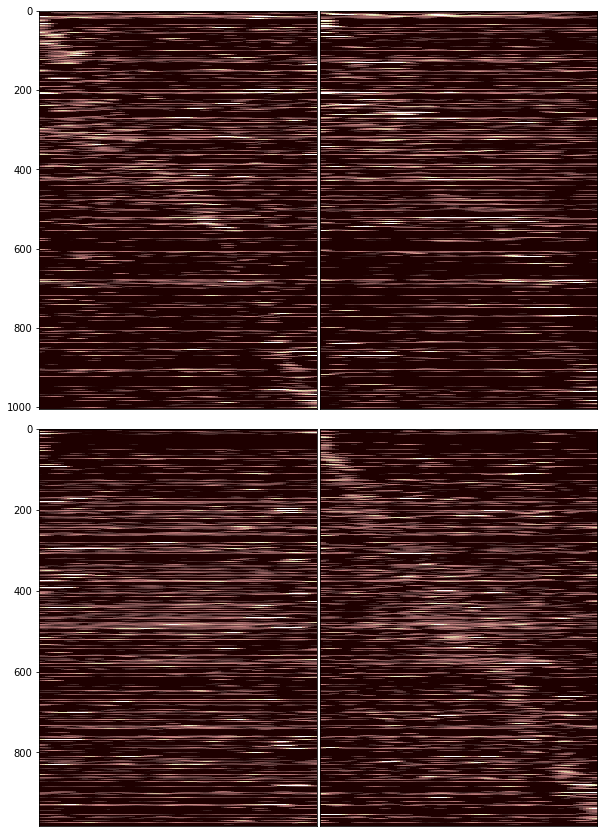

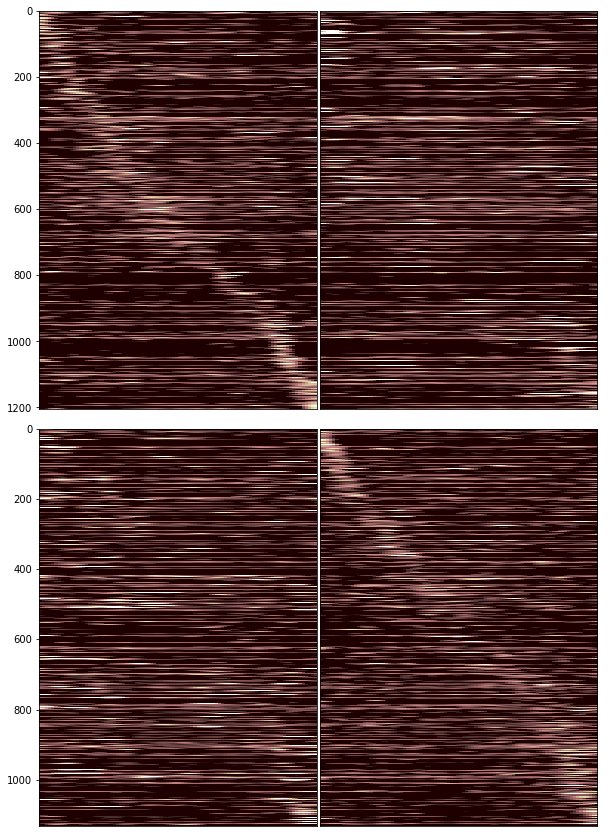

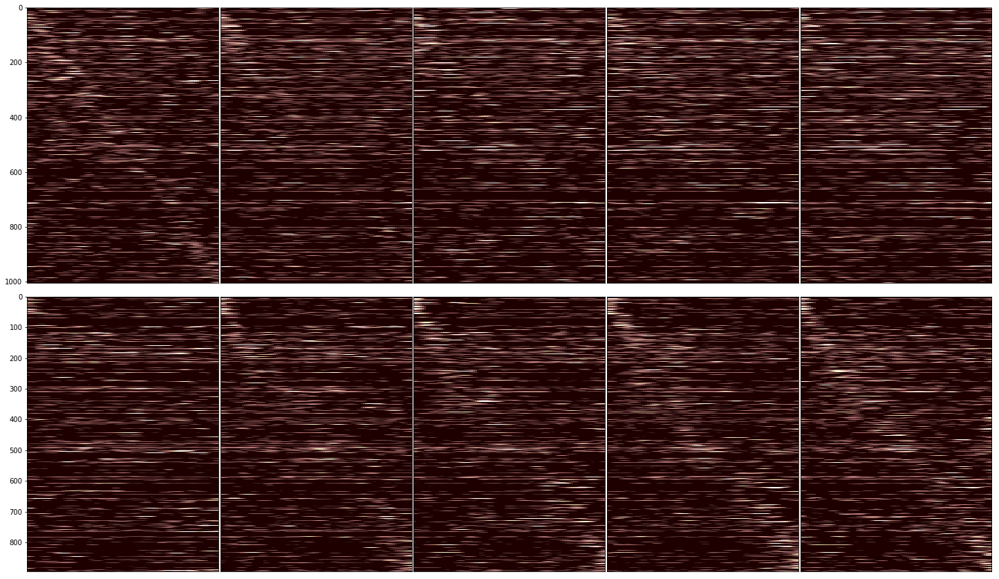

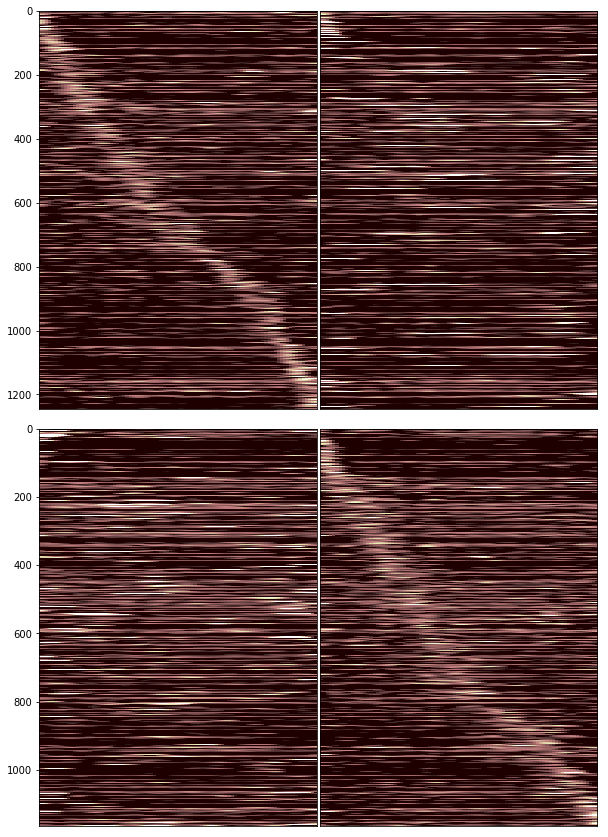

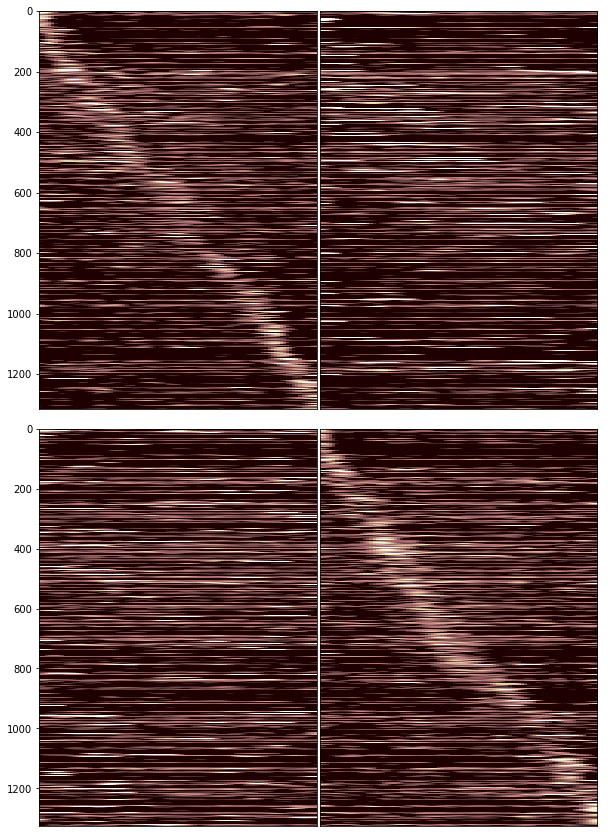

...

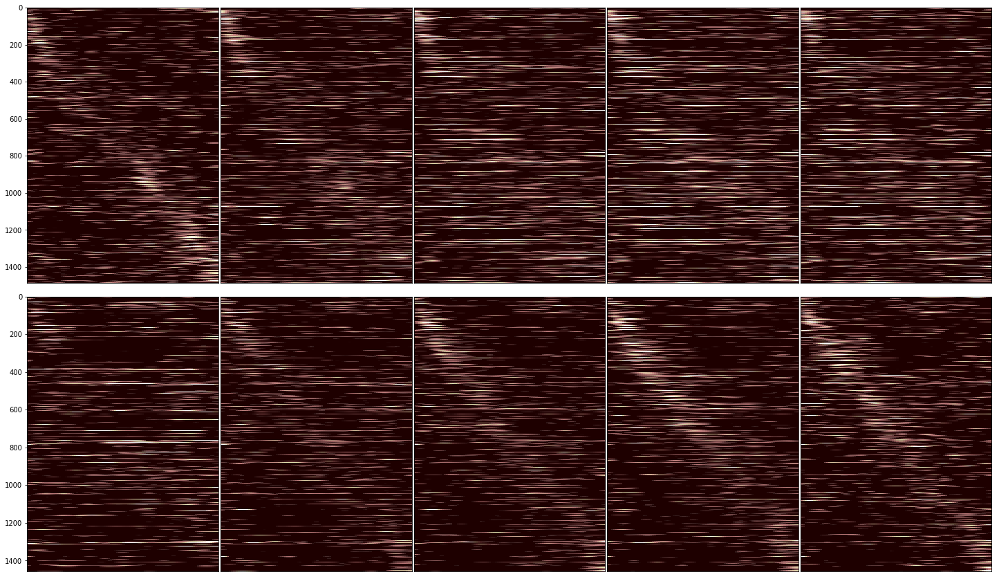

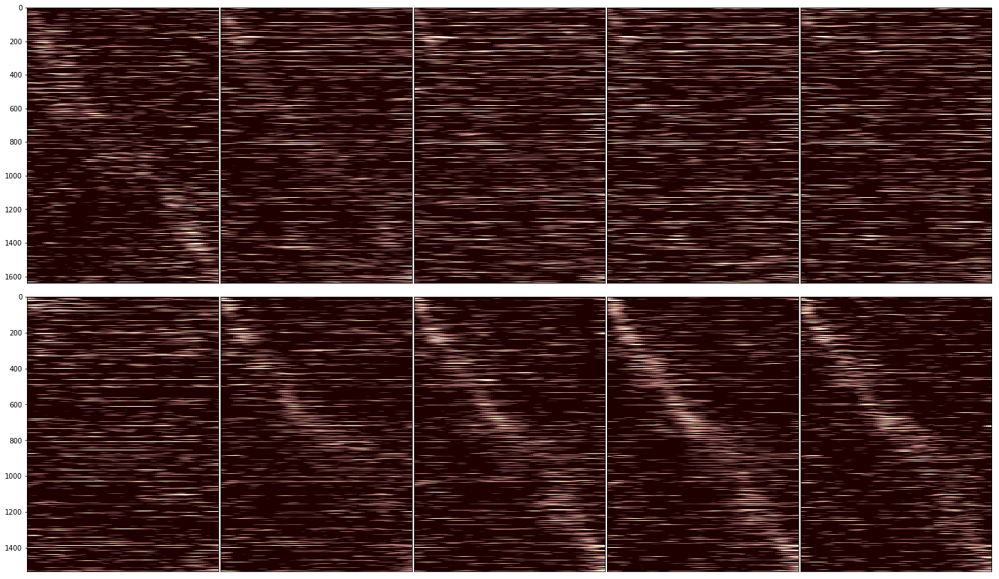

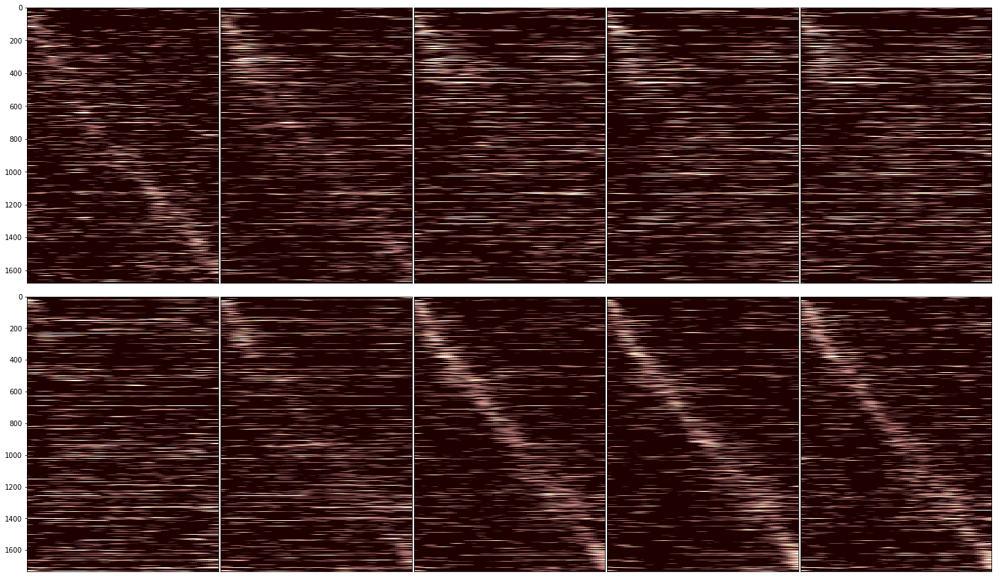

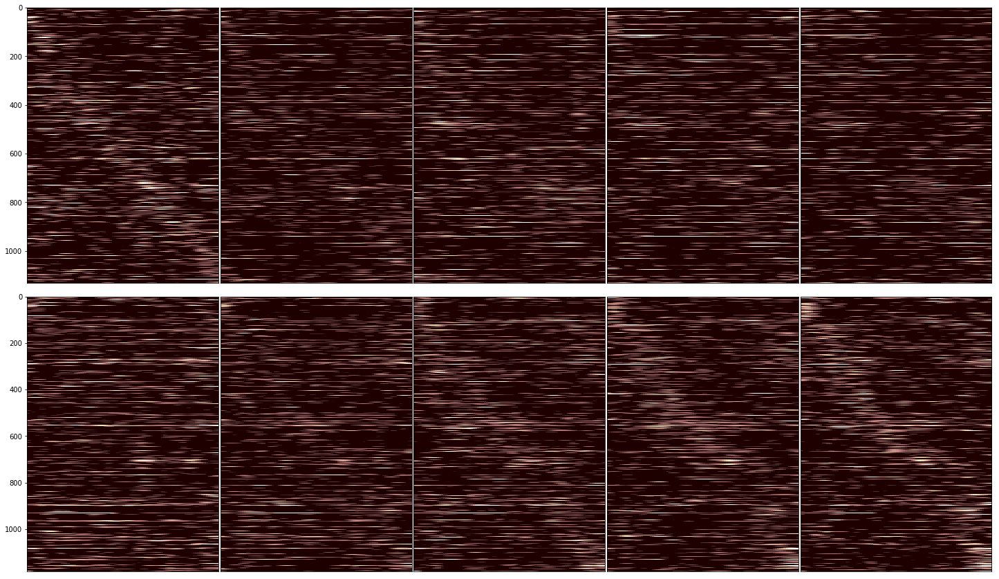

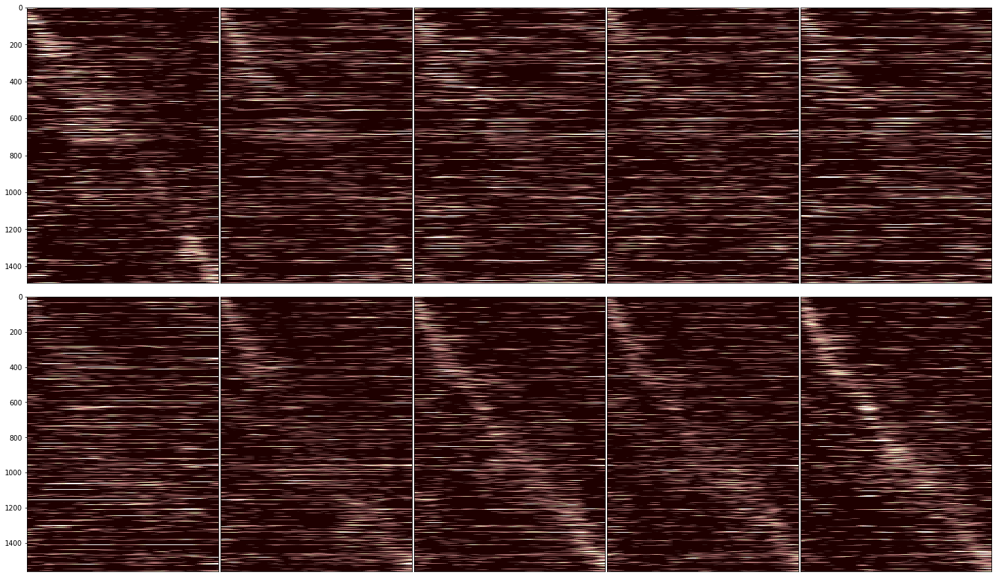

In [70]:
def _get_frac(sess):
    fname = os.path.join("G:\\My Drive\\Figures\\TwoTower\\SingleSession",sess['MouseName'],"TwoTower_foraging_%s_%i" % (sess["DateFolder"],sess["SessionNumber"]),"pc_masks.pkl")
#     try:
#         with open(fname,'rb') as f:
#             res=pickle.load(f)
#         masks = res['masks']
#     except:
    FR, masks, SI = pc.single_session(sess,win_trial_perm=True,deconv=True)
#         with open(fname,'wb') as f:
#             pickle.dump({'masks':masks},f)
    return masks[0].sum()/masks[0].shape[0], masks[1].sum()/masks[1].shape[0], (masks[0]*masks[1]).sum()/masks[0].shape[0]
    
    
def _mouse_get_frac(mouse,first_sess=0):
    frac0,frac1,fracc = [],[],[]
    df_mouse = df[df['MouseName'].str.match(mouse)]
    for sess_ind in range(first_sess,df_mouse.shape[0]):
        sess = df_mouse.iloc[sess_ind]
        
        _frac0,_frac1,_fracc = _get_frac(sess)
        frac0.append(_frac0)
        frac1.append(_frac1)
        fracc.append(_fracc)

    return np.array(frac0),np.array(frac1),np.array(fracc)


def frac_list(mouselist):
    frac0,frac1,fracc=[],[],[]
    for mouse in mouselist:
        _frac0,_frac1,_fracc = _mouse_get_frac(mouse,first_sess=0)
        frac0.append(_frac0)
        frac1.append(_frac1)
        fracc.append(_fracc)
    return frac0, frac1, fracc

rare_frac0,rare_frac1,rare_fracc = frac_list(morph_rare)
fam_frac0, fam_frac1, fam_fracc = frac_list(morph_familiar)
    

# df_mouse = df[df['MouseName'].str.match(mouse)]
# sess = df_mouse.iloc[-1]
# frac0,frac1,fracc = _get_frac(sess)

(0, 0)
(0, 1)
(1, 0)
(1, 1)


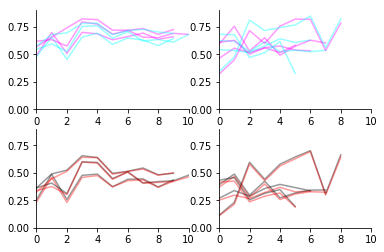

In [71]:
f,ax = plt.subplots(2,2)

for (fr0,fr1,frc) in zip(rare_frac0,rare_frac1,rare_fracc):
    ax[0,0].plot(fr0,color=plt.cm.cool(1.),alpha=.4)
    ax[0,0].plot(fr1,color=plt.cm.cool(0.),alpha=.4)
    ax[1,0].plot(frc,color='black',alpha=.4)
    ax[1,0].plot(fr0*fr1,color='red',alpha=.4)



for (fr0,fr1,frc) in zip(fam_frac0,fam_frac1,fam_fracc):
    ax[0,1].plot(fr0,color=plt.cm.cool(1.),alpha=.4)
    ax[0,1].plot(fr1,color=plt.cm.cool(0.),alpha=.4)
    ax[1,1].plot(frc,color='black',alpha=.4)
    ax[1,1].plot(fr0*fr1,color='red',alpha=.4)

for p in product([0,1],[0,1]):
    print(p)
    ax[p].set_xlim([0,10])
    ax[p].set_ylim([0,.9])
    ax[p].spines['top'].set_visible(False)
    ax[p].spines['right'].set_visible(False)

In [72]:
f.savefig("G:\\My Drive\\manuscripts\\MightyMorphinPhotonRangers\\Figures\\PlaceCellFractions.pdf",format='pdf')